In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [9]:
df=pd.read_csv(r'C:\Users\NIDHI CHHABRIA\Downloads\UnemploymentInIndia.csv')
df.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area
0,Andhra Pradesh,31-05-2019,Monthly,3.65,11999139.0,43.24,Rural
1,Andhra Pradesh,30-06-2019,Monthly,3.05,11755881.0,42.05,Rural
2,Andhra Pradesh,31-07-2019,Monthly,3.75,12086707.0,43.50,Rural
3,Andhra Pradesh,31-08-2019,Monthly,3.32,12285693.0,43.97,Rural
4,Andhra Pradesh,30-09-2019,Monthly,5.17,12256762.0,44.68,Rural


In [10]:
df.tail()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area
763,NaN,NaN,NaN,NaN,NaN,NaN,NaN
764,NaN,NaN,NaN,NaN,NaN,NaN,NaN
765,NaN,NaN,NaN,NaN,NaN,NaN,NaN
766,NaN,NaN,NaN,NaN,NaN,NaN,NaN
767,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 7 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Region                                    740 non-null    object 
 1    Date                                     740 non-null    object 
 2    Frequency                                740 non-null    object 
 3    Estimated Unemployment Rate (%)          740 non-null    float64
 4    Estimated Employed                       740 non-null    float64
 5    Estimated Labour Participation Rate (%)  740 non-null    float64
 6   Area                                      740 non-null    object 
dtypes: float64(3), object(4)
memory usage: 42.1+ KB


In [12]:
df.dropna(inplace=True)

In [13]:
df.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area
0,Andhra Pradesh,31-05-2019,Monthly,3.65,11999139.0,43.24,Rural
1,Andhra Pradesh,30-06-2019,Monthly,3.05,11755881.0,42.05,Rural
2,Andhra Pradesh,31-07-2019,Monthly,3.75,12086707.0,43.50,Rural
3,Andhra Pradesh,31-08-2019,Monthly,3.32,12285693.0,43.97,Rural
4,Andhra Pradesh,30-09-2019,Monthly,5.17,12256762.0,44.68,Rural


In [14]:
pd.DataFrame(df.apply(lambda col: len(col.unique())),columns=["Unique Values Count"])

,Unique Values Count
Region,28
Date,14
Frequency,2
Estimated Unemployment Rate (%),624
Estimated Employed,740
Estimated Labour Participation Rate (%),626
Area,2


In [17]:
df[' Date'] = pd.to_datetime(df[' Date'])
df[' Date'].info

<bound method Series.info of 0     2019-05-31
1     2019-06-30
2     2019-07-31
3     2019-08-31
4     2019-09-30
         ...    
749   2020-02-29
750   2020-03-31
751   2020-04-30
752   2020-05-31
753   2020-06-30
Name:  Date, Length: 740, dtype: datetime64[ns]>

In [19]:
from sklearn.preprocessing import MinMaxScaler
X = df[' Estimated Employed'].values.reshape(-1, 1)
scaler = MinMaxScaler()
df[' Estimated Employed'] = scaler.fit_transform(X)

In [20]:
df.head()

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Area
0,Andhra Pradesh,2019-05-31,Monthly,3.65,0.261321,43.24,Rural
1,Andhra Pradesh,2019-06-30,Monthly,3.05,0.256002,42.05,Rural
2,Andhra Pradesh,2019-07-31,Monthly,3.75,0.263236,43.50,Rural
3,Andhra Pradesh,2019-08-31,Monthly,3.32,0.267588,43.97,Rural
4,Andhra Pradesh,2019-09-30,Monthly,5.17,0.266955,44.68,Rural


In [21]:
print(df['Region'].value_counts())
print('*'*33)
print(df[' Date'].value_counts())
print('*'*33)
print(df[' Frequency'].value_counts())
print('*'*33)
print(df['Area'].value_counts())

Region
Andhra Pradesh      28
Kerala              28
West Bengal         28
Uttar Pradesh       28
Tripura             28
Telangana           28
Tamil Nadu          28
Rajasthan           28
Punjab              28
Odisha              28
Madhya Pradesh      28
Maharashtra         28
Karnataka           28
Jharkhand           28
Himachal Pradesh    28
Haryana             28
Gujarat             28
Delhi               28
Chhattisgarh        28
Bihar               28
Meghalaya           27
Uttarakhand         27
Assam               26
Puducherry          26
Goa                 24
Jammu & Kashmir     21
Sikkim              17
Chandigarh          12
Name: count, dtype: int64
*********************************
 Date
2019-10-31    55
2019-11-30    55
2019-05-31    54
2019-06-30    54
2019-07-31    54
2019-08-31    53
2019-12-31    53
2020-01-31    53
2020-02-29    53
2019-09-30    52
2020-03-31    52
2020-04-30    51
2020-05-31    51
2020-06-30    50
Name: count, dtype: int64
*******************

In [22]:
Area_encoding = {'Rural': 0, 'Urban': 1}

# Encode 'Gender' column using loc
df.loc[:, 'Area'] = df['Area'].map(Area_encoding)

In [23]:
rural_df = df[df['Area'] == 0]
urban_df = df[df['Area'] == 1]
print(rural_df.shape)
print(urban_df.shape)

(359, 7)
(381, 7)


In [24]:
grouped_rural_stats = rural_df.groupby('Region').agg({
    ' Estimated Unemployment Rate (%)': ['min', 'mean', 'max', 'std'],
    ' Estimated Labour Participation Rate (%)': ['min', 'mean', 'max', 'std'],
    ' Estimated Employed': ['min', 'mean', 'max']
})

grouped_urban_stats = urban_df.groupby('Region').agg({
    ' Estimated Unemployment Rate (%)': ['min', 'mean', 'max', 'std'],
    ' Estimated Labour Participation Rate (%)': ['min', 'mean', 'max', 'std'],
    ' Estimated Employed': ['min', 'mean', 'max']
})

grouped_rural_stats.columns = ['Unemployment Rate Min', 'Unemployment Rate Mean','Unemployment Rate Max', 'Unemployment Rate Std',
                         'Labour Participation Rate Min', 'Labour Participation Rate Mean','Labour Participation Rate Max','Labour Participation Rate Std',
                            'Estimated Employed Min', 'Estimated Employed Mean','Estimated Employed Max']
grouped_urban_stats.columns = ['Unemployment Rate Min', 'Unemployment Rate Mean','Unemployment Rate Max', 'Unemployment Rate Std',
                         'Labour Participation Rate Min', 'Labour Participation Rate Mean','Labour Participation Rate Max','Labour Participation Rate Std',
                           'Estimated Employed Min', 'Estimated Employed Mean','Estimated Employed Max']

In [25]:
def plot_heatmap_(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(30,25))  # Create a figure with two subplots

    # Plot the first column
    sns.heatmap(data.loc[:, ['Unemployment Rate Min', 'Unemployment Rate Mean','Unemployment Rate Max']], ax=axs[0], annot=True,cmap="coolwarm",annot_kws={"size": 22})
    axs[0].set_title('Unemployment Rate', fontsize=15)

    # Plot the second column
    sns.heatmap(data.loc[:, ['Labour Participation Rate Min', 'Labour Participation Rate Mean','Labour Participation Rate Max']], ax=axs[1], annot=True, cmap="coolwarm",annot_kws={"size": 22})
    axs[1].set_title('Labour Participation Rate', fontsize=15)

    # Set the overall title for the figure 
    plt.suptitle(title, fontsize=15)
    axs[0].set_xlabel('Statistics', fontsize=15)
    axs[0].set_ylabel('Region', fontsize=15)
    axs[1].set_xlabel('Statistics', fontsize=15)
    axs[1].set_ylabel('Region', fontsize=15)
    axs[0].tick_params(axis='x', rotation=45, labelsize=21)
    axs[0].tick_params(axis='y', labelsize=22)
    axs[1].tick_params(axis='x', rotation=45, labelsize=21)
    axs[1].tick_params(axis='y', labelsize=22)
    plt.tight_layout()

In [26]:
grouped_df = df.groupby('Region')


def plot_rate_col_rate(grouped_df, rate_col):
   
    # Iterate over unique regions
    for region, region_data in grouped_df:
        # Convert date column to datetime if it's not already
        region_data[' Date'] = pd.to_datetime(region_data[' Date'])
        
        # Sort region data by date
        region_data.sort_values(by=' Date', inplace=True)
        
        # Filter region data for rural and urban areas
        rural_data = region_data[region_data['Area'] == 0]
        urban_data = region_data[region_data['Area'] == 1]
        
        # Plot the data for rural and urban areas
        plt.figure(figsize=(10, 6))
        plt.plot(rural_data[' Date'], rural_data[rate_col], marker='o', linestyle='-', label='Rural')
        plt.plot(urban_data[' Date'], urban_data[rate_col], marker='o', linestyle='-', label='Urban')
        plt.title(f'{rate_col} Over Time for {region}')
        plt.xlabel('Date')
        plt.ylabel(f'{rate_col}')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.tight_layout()
        plt.legend()
        plt.show()

In [27]:
def plot_comparison(data_urban, data_rural, y_label, title):
   
    plt.figure(figsize=(30, 14))
    plt.plot(data_urban, label='Urban', marker='o', linewidth=3)
    plt.plot(data_rural, label='Rural', marker='o', linewidth=3)
    plt.title(title, fontsize=22)
    plt.xlabel('Regions',fontsize=22)
    plt.ylabel(y_label, fontsize=22)
    plt.xticks(rotation=90, fontsize=25)
    plt.yticks(rotation=0, fontsize=22)
    plt.legend(prop={'size': 22})
    plt.grid(True)
    plt.show()


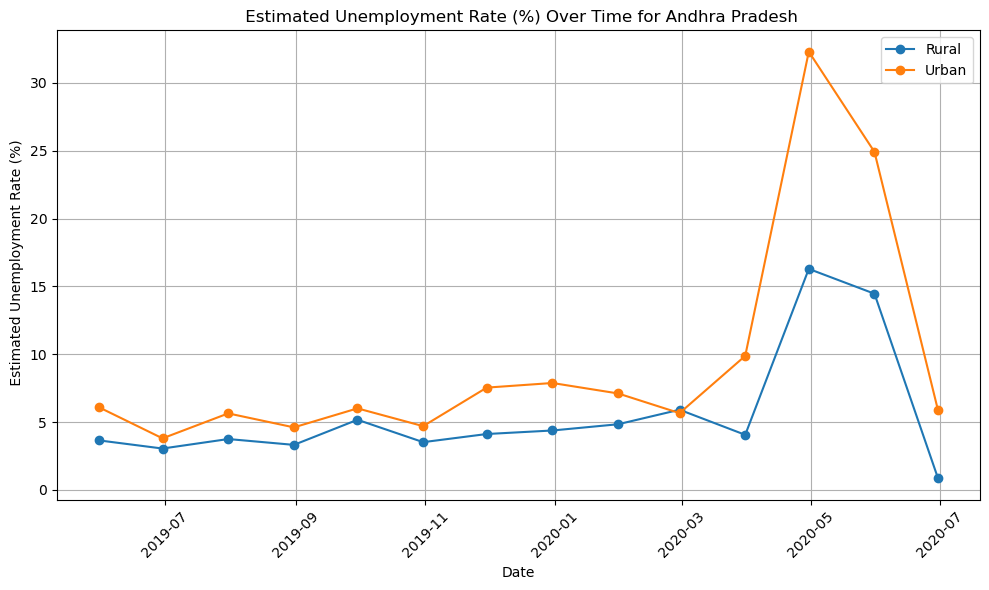

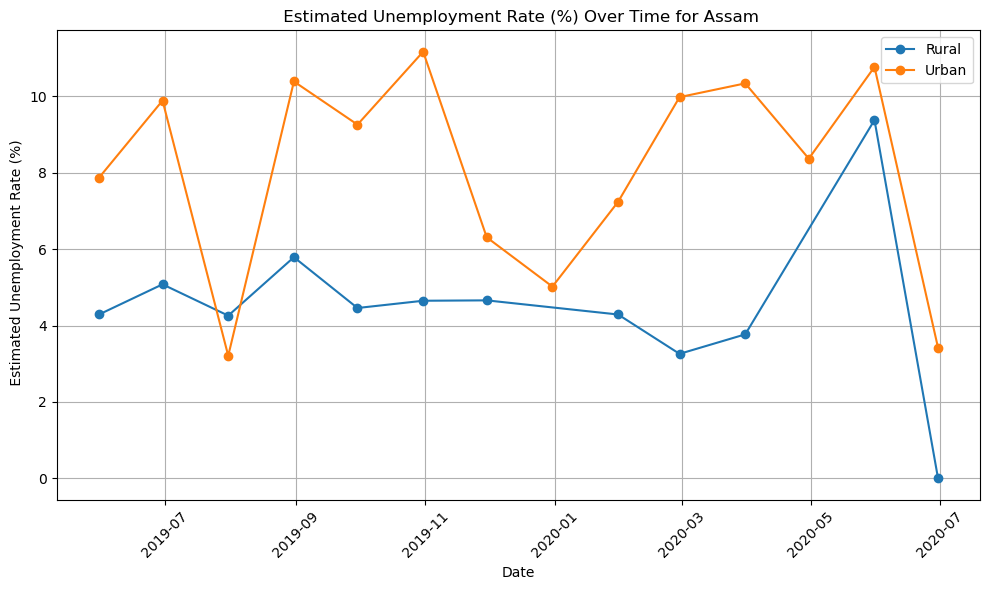

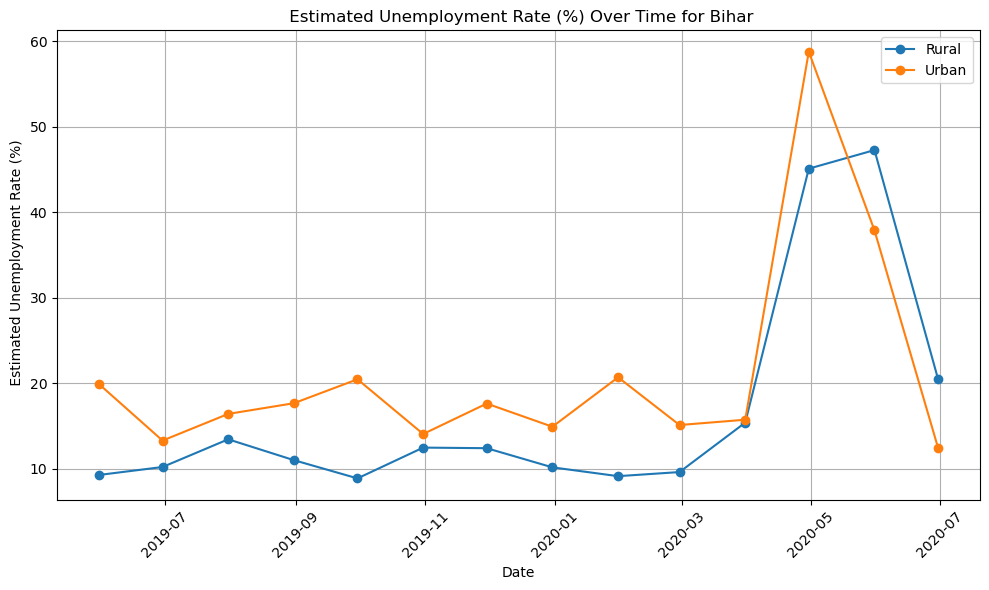

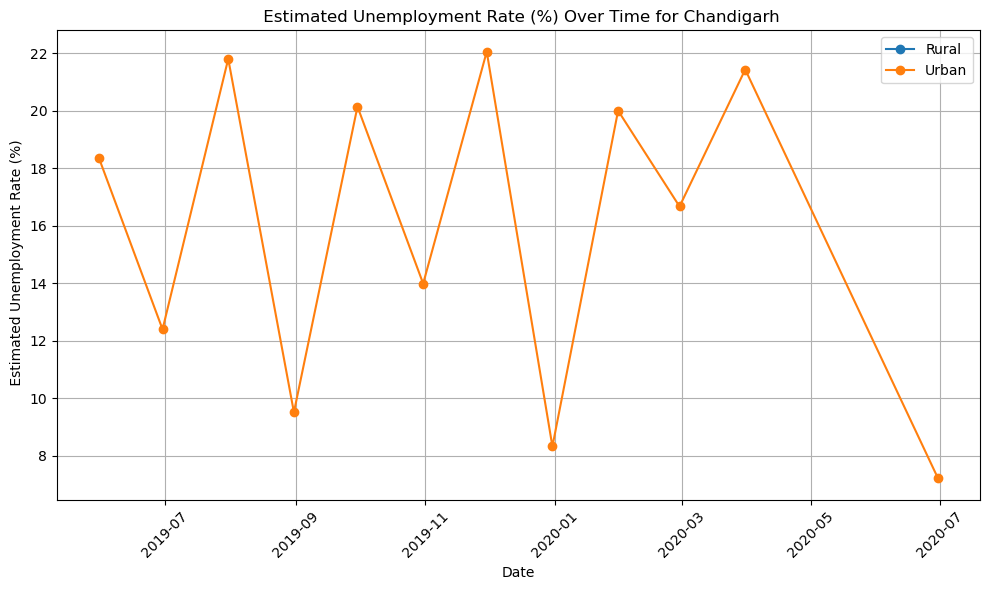

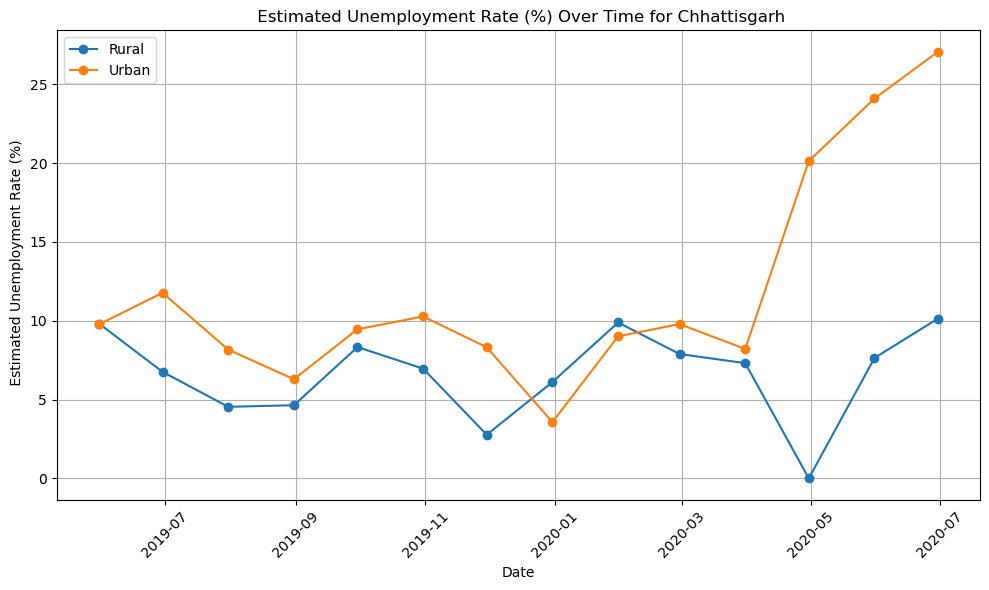

...

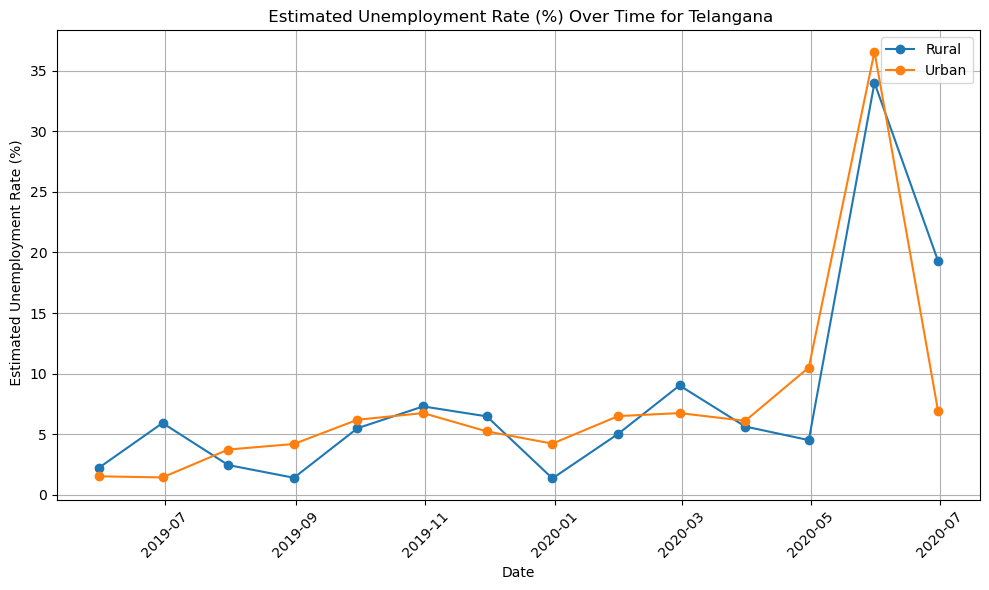

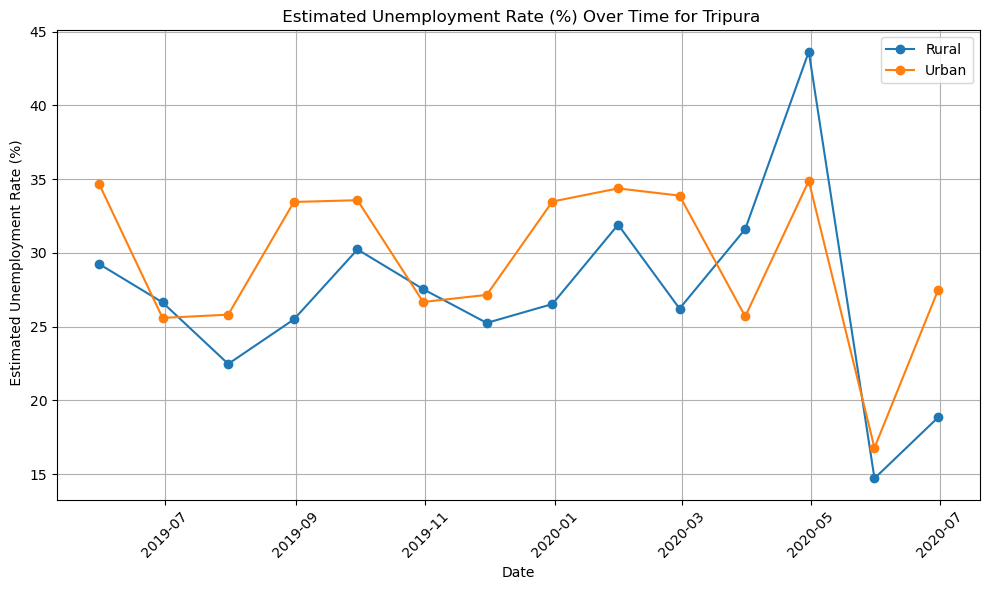

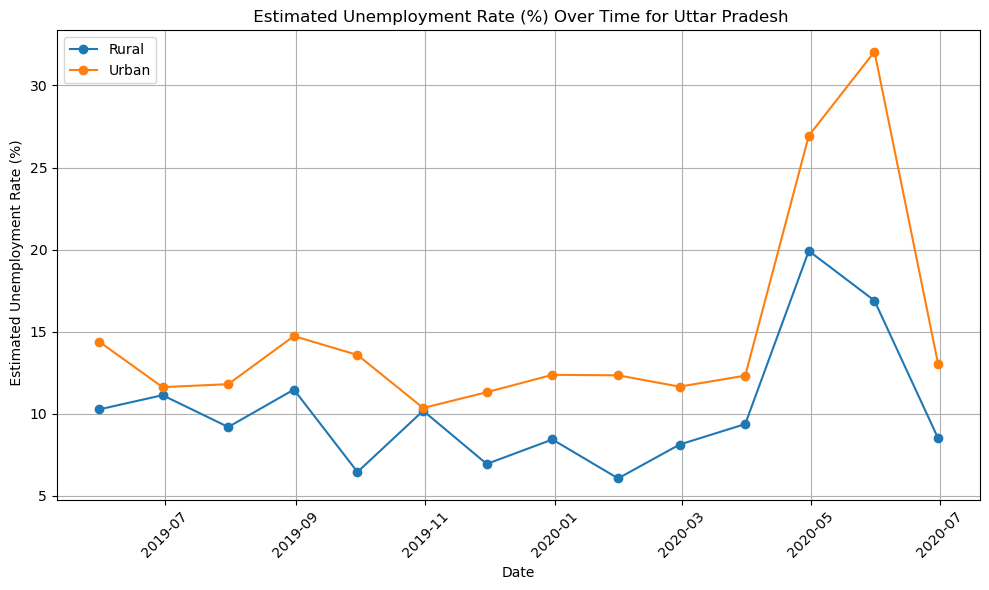

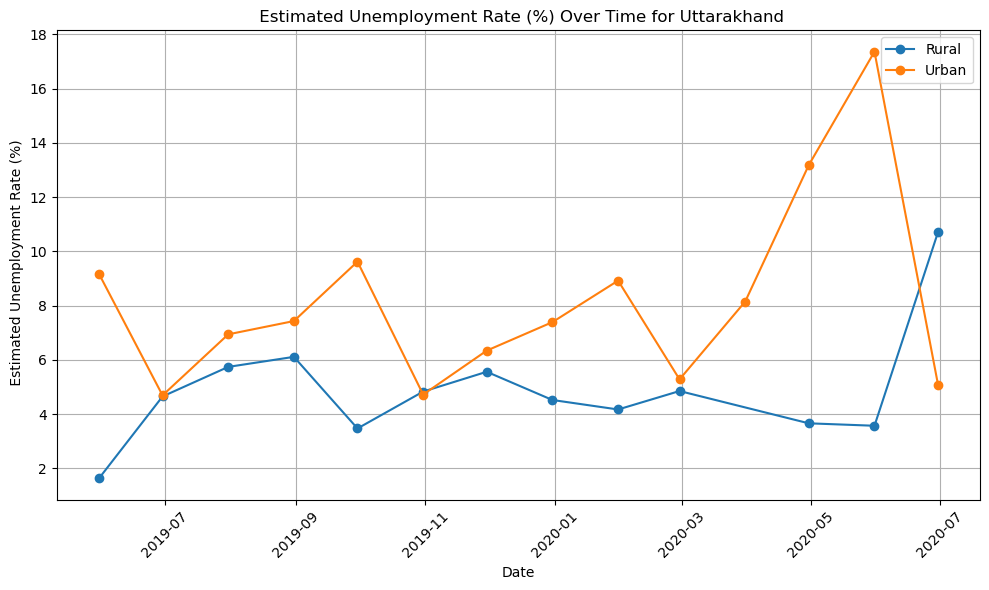

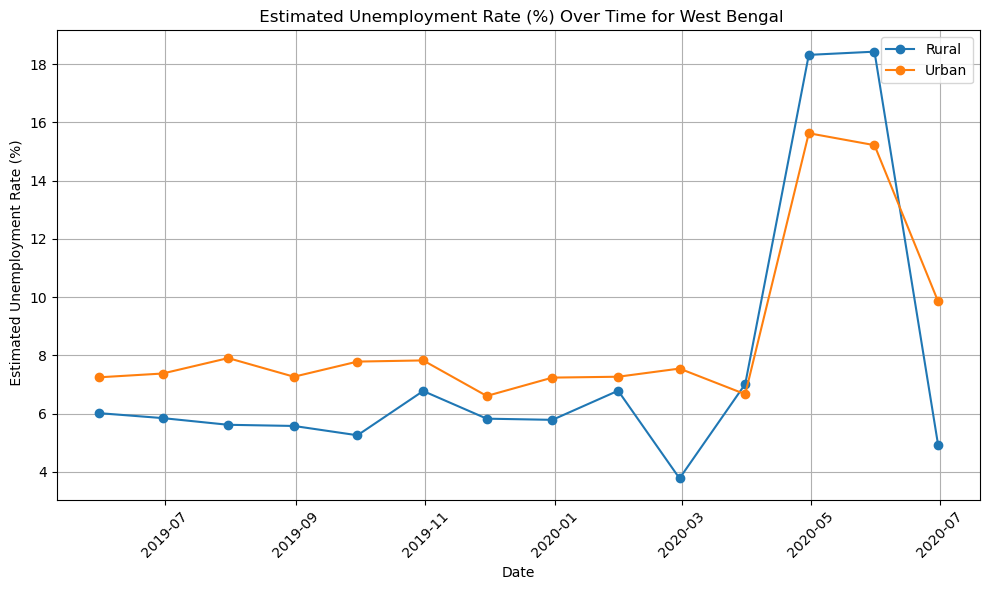

In [28]:
plot_rate_col_rate(grouped_df, ' Estimated Unemployment Rate (%)')

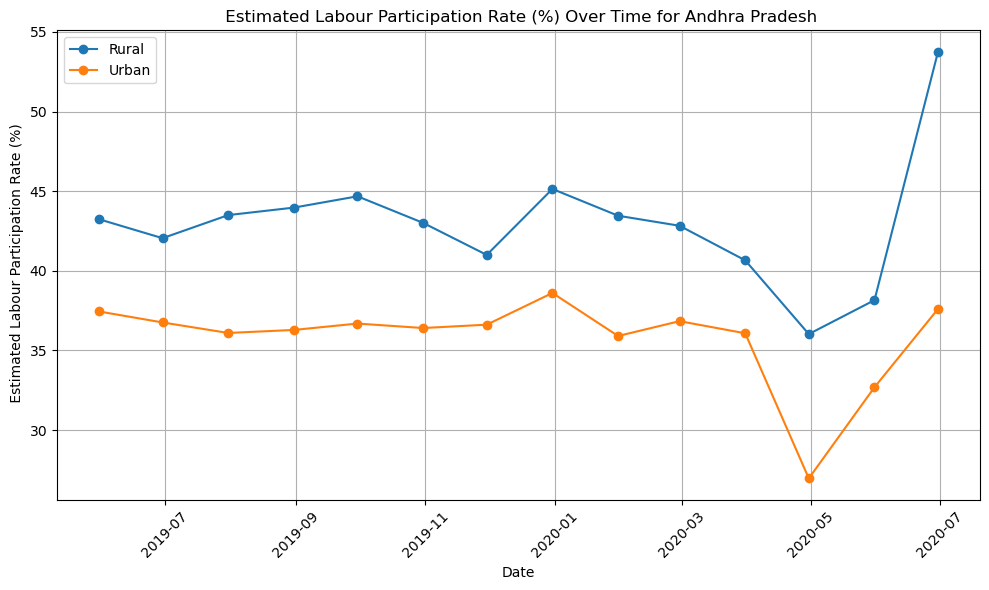

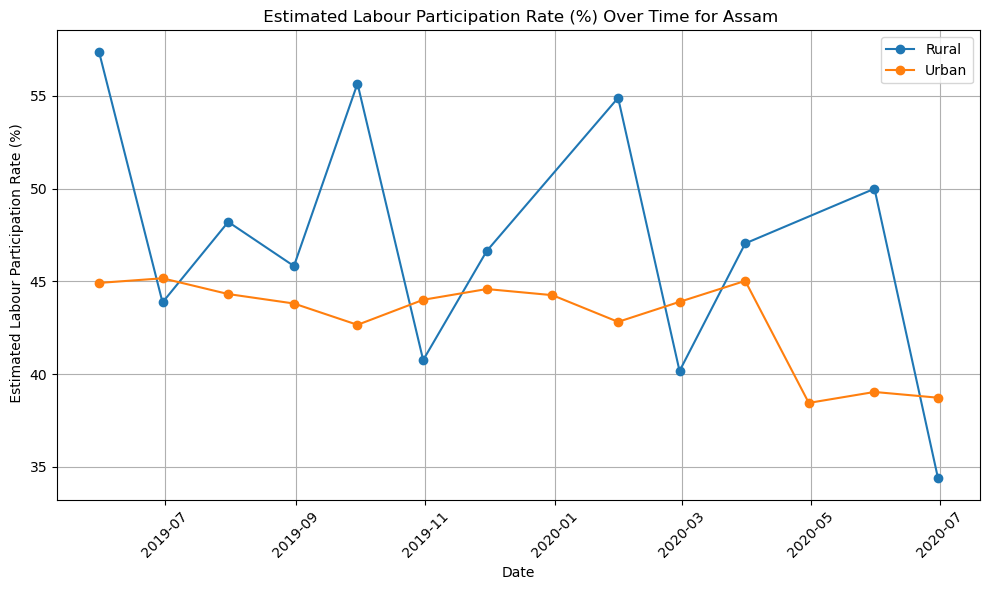

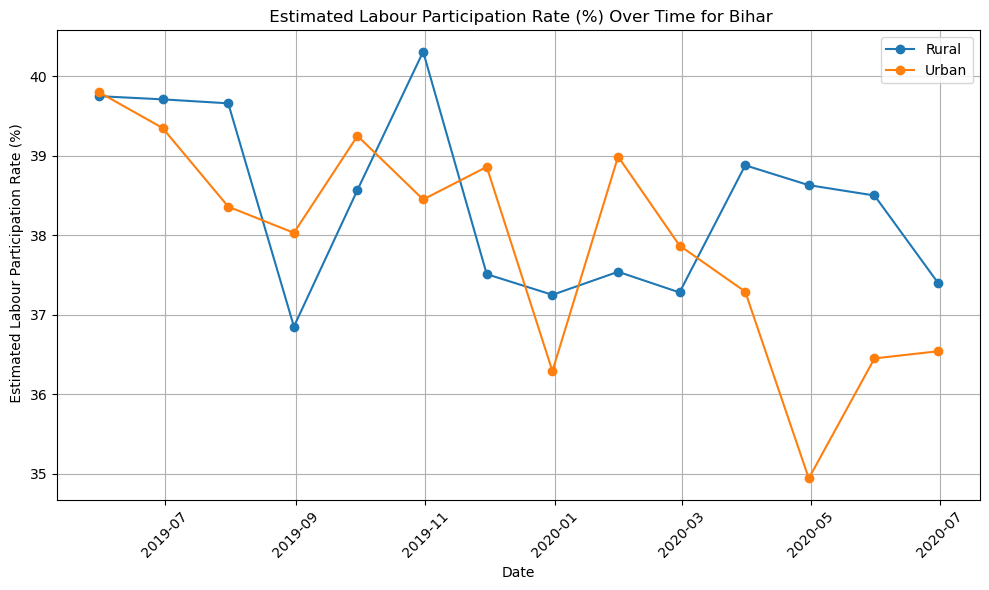

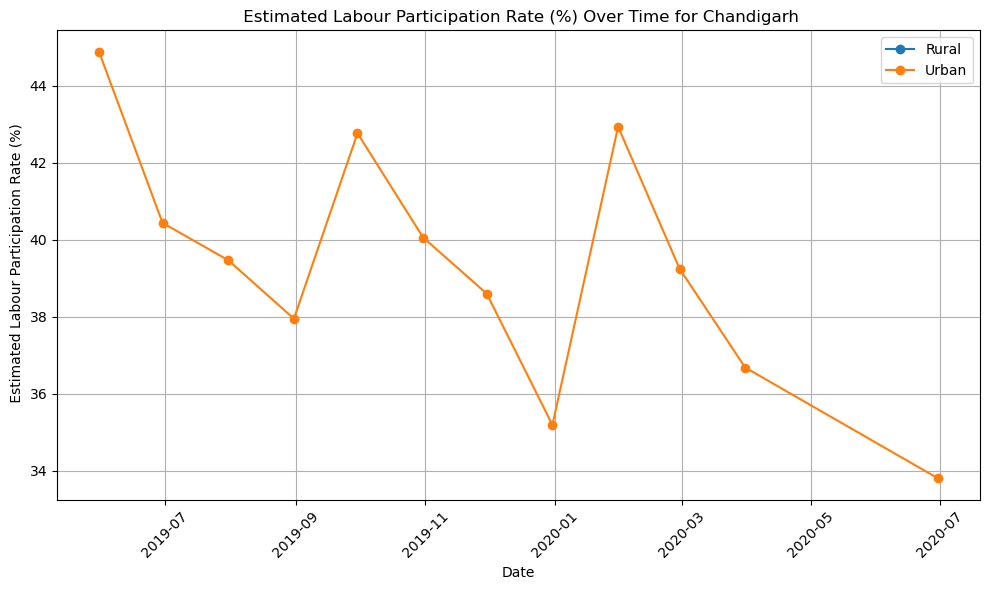

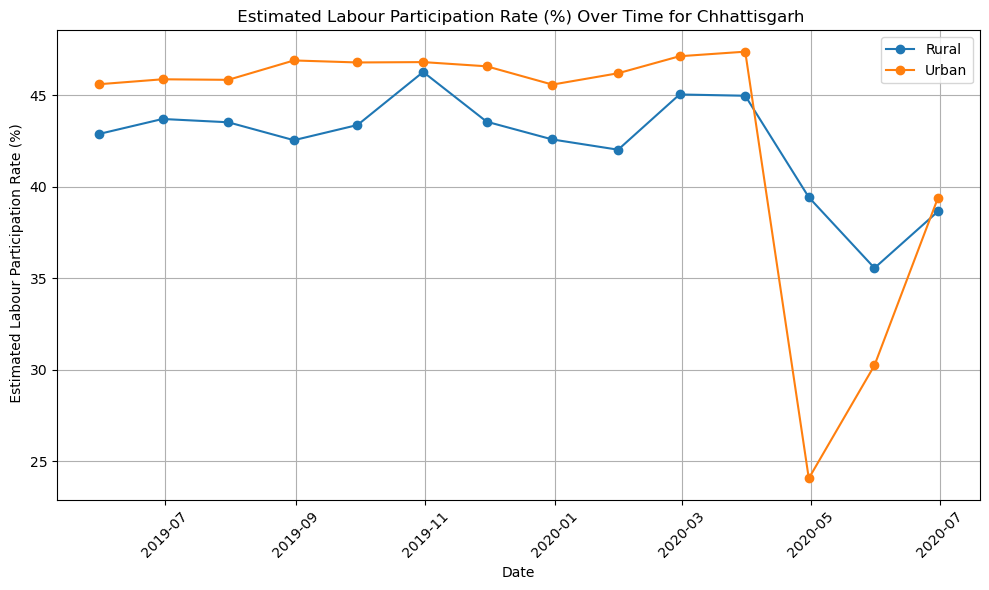

...

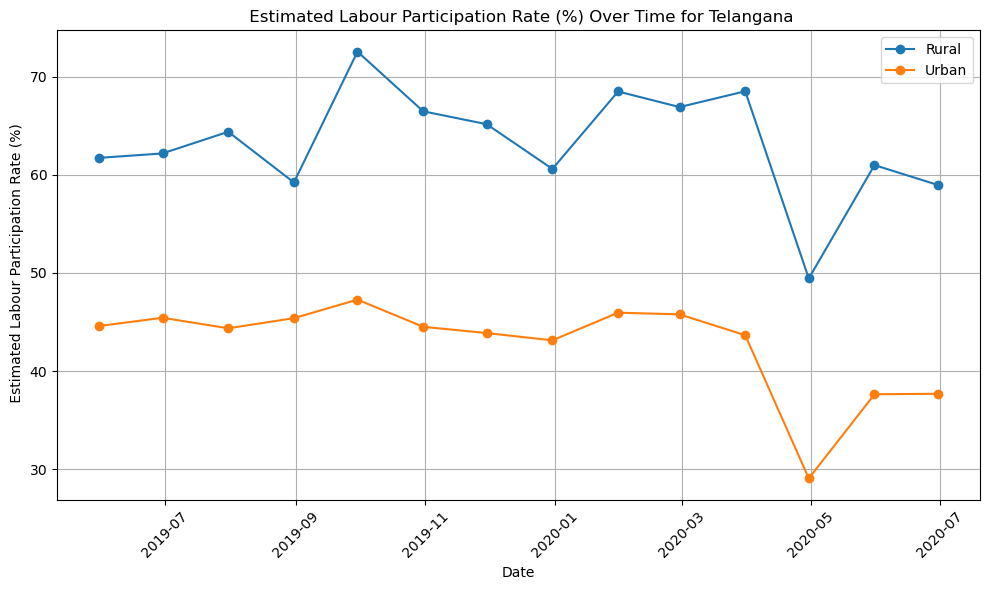

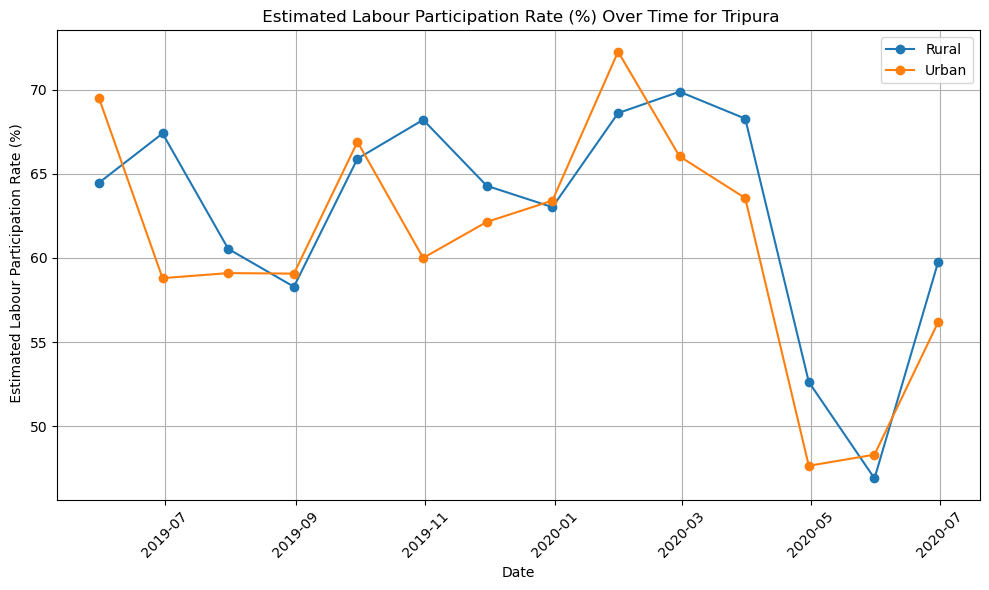

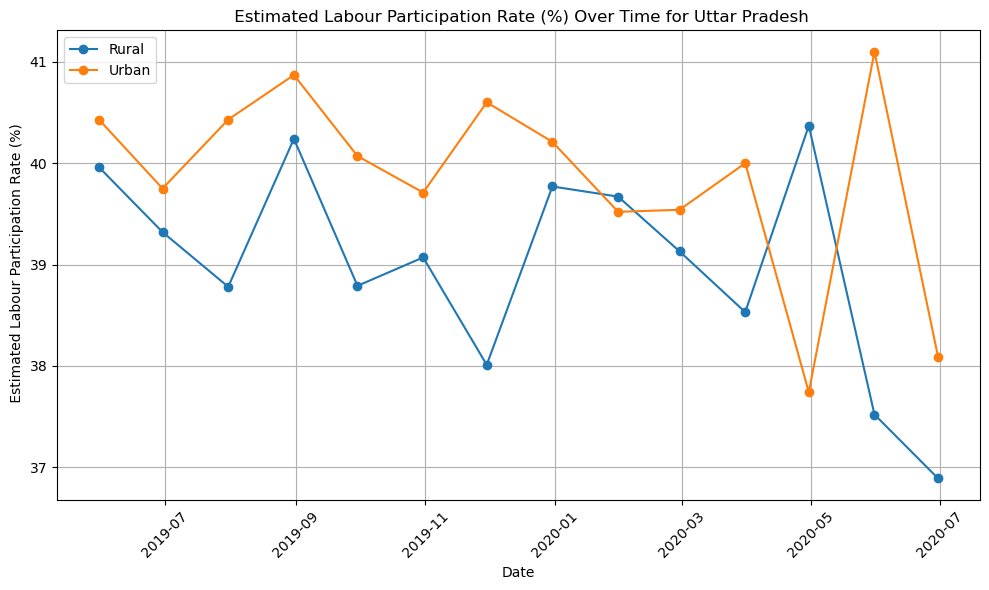

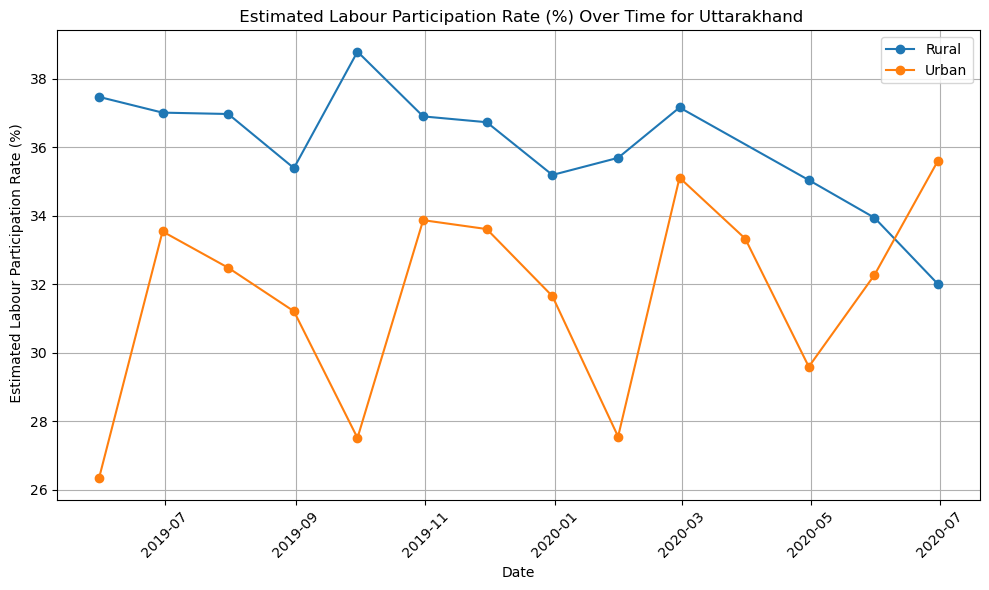

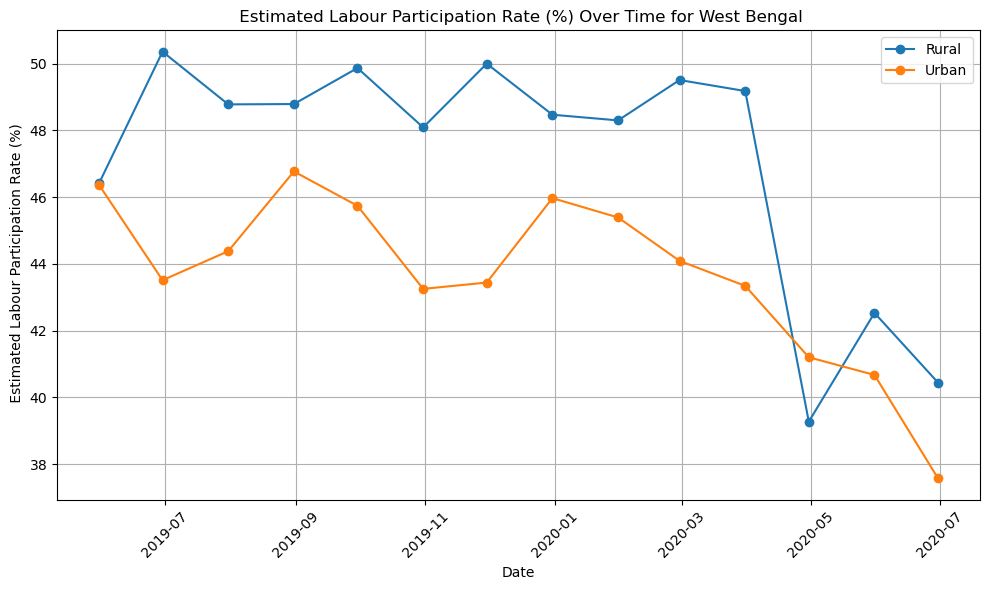

In [29]:
plot_rate_col_rate(grouped_df, ' Estimated Labour Participation Rate (%)')

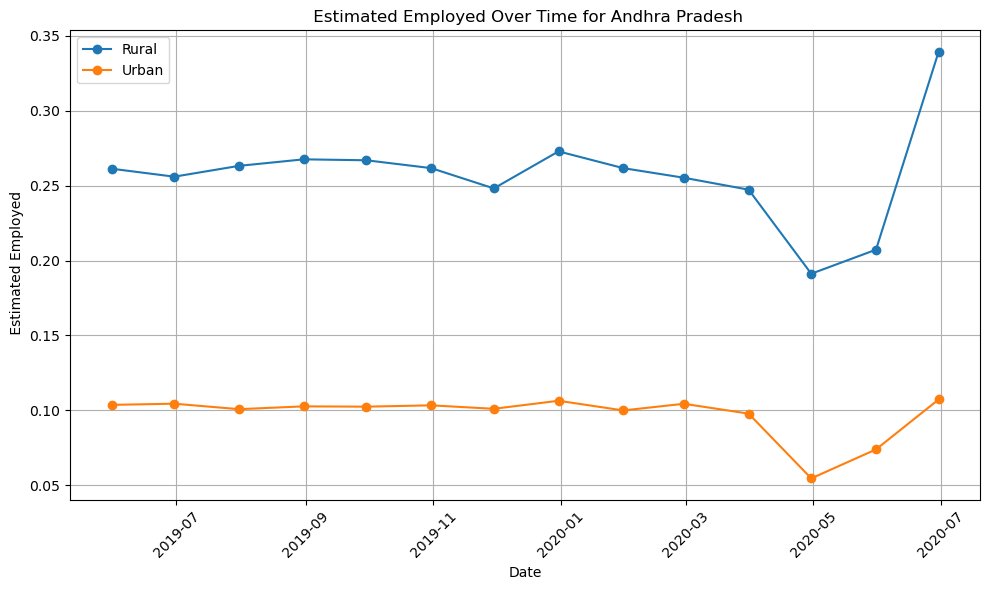

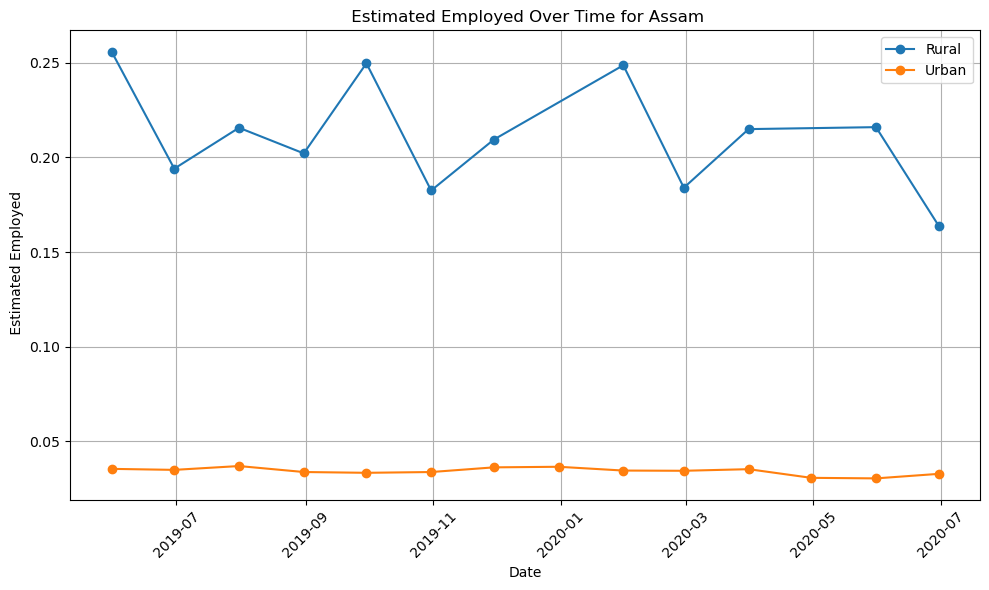

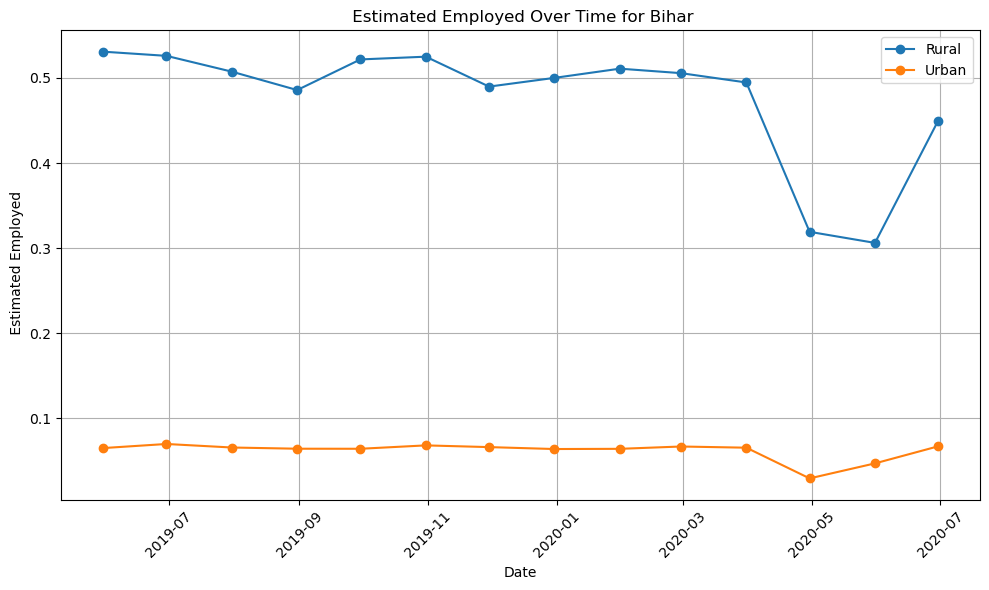

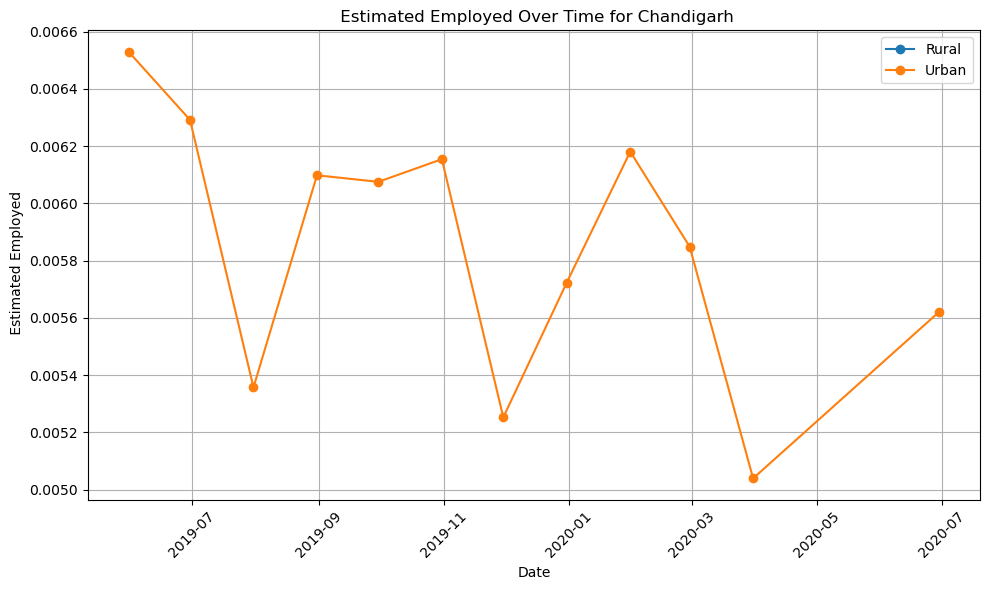

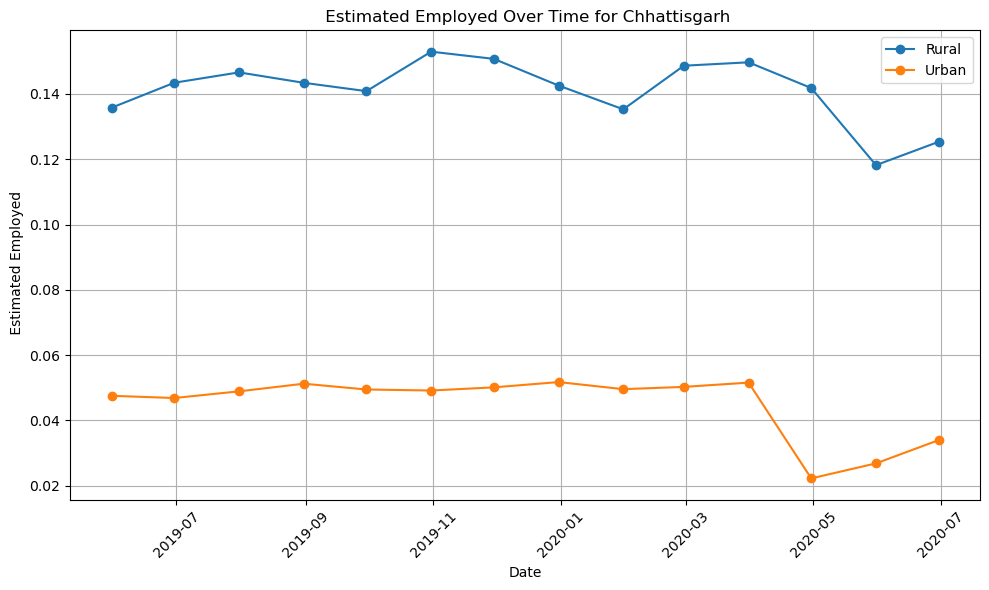

...

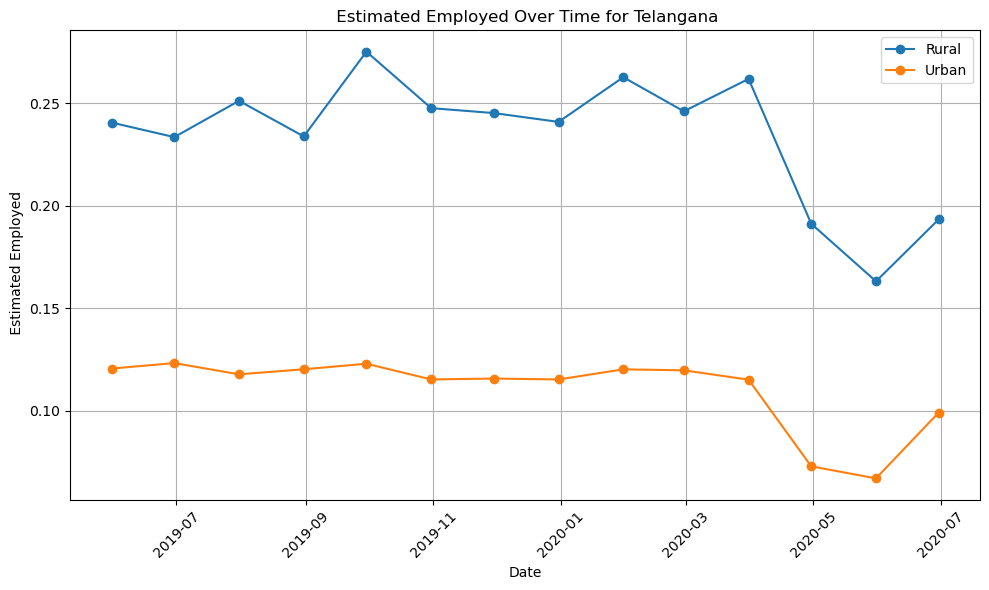

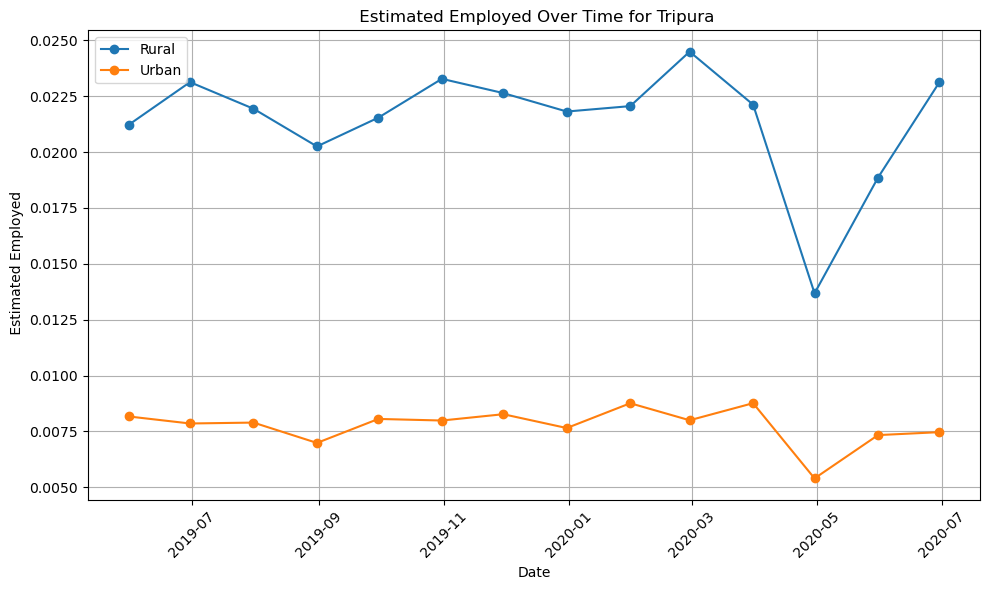

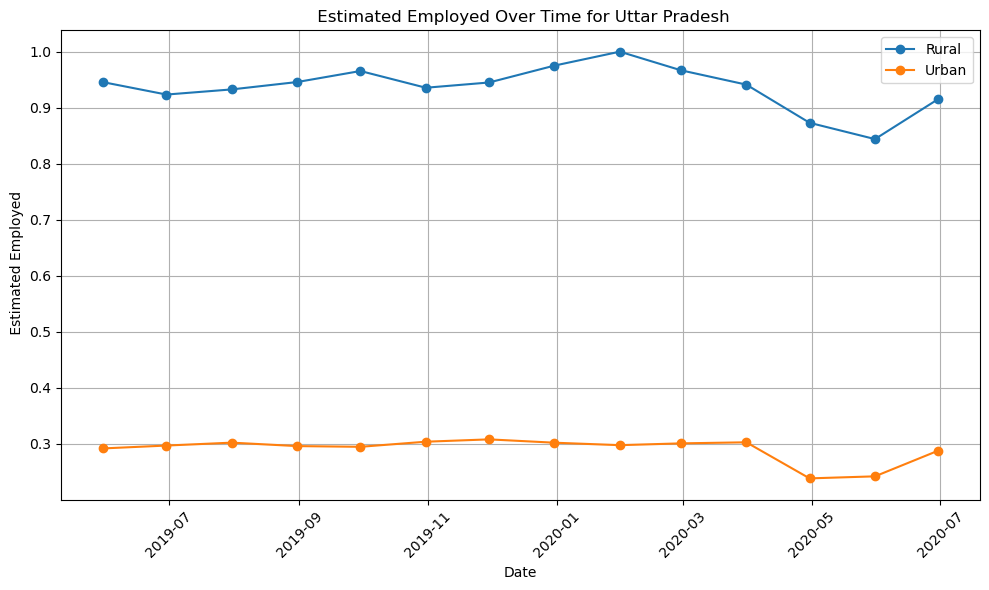

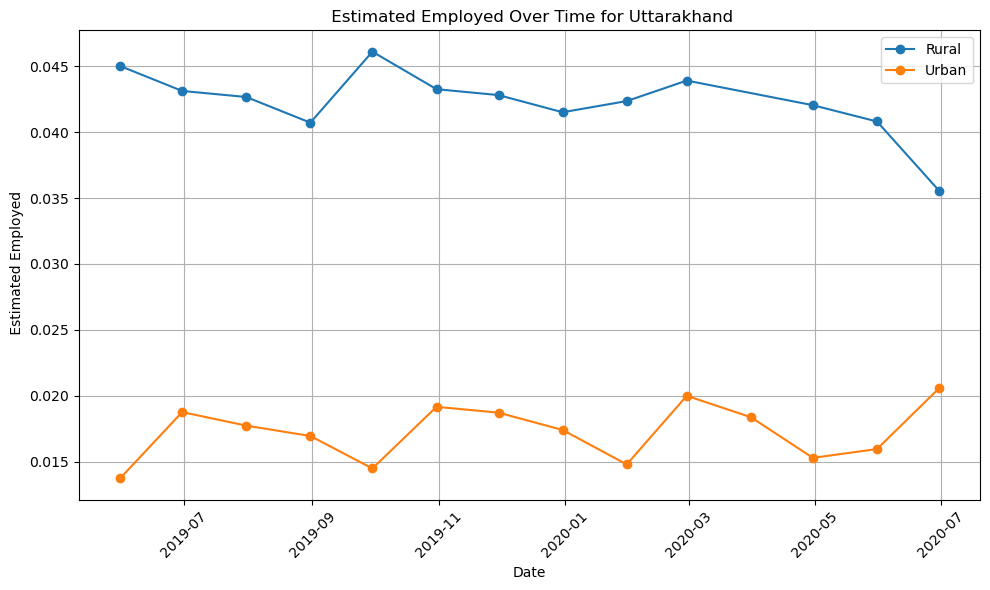

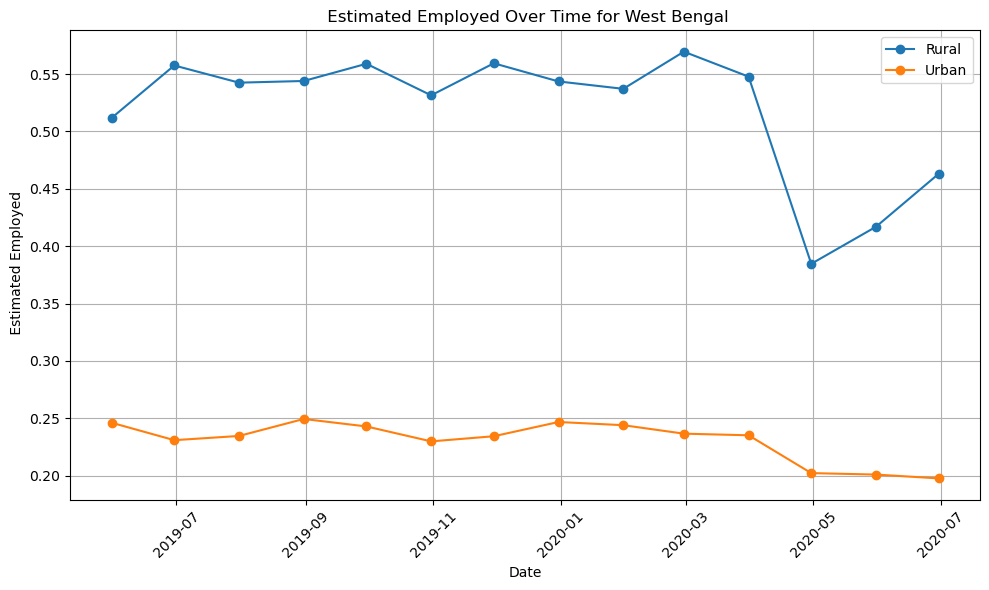

In [30]:
plot_rate_col_rate(grouped_df, ' Estimated Employed')

In [31]:
# droping Chandigarh so that we can compair
grouped_urban_stats_com = grouped_urban_stats.drop('Chandigarh')

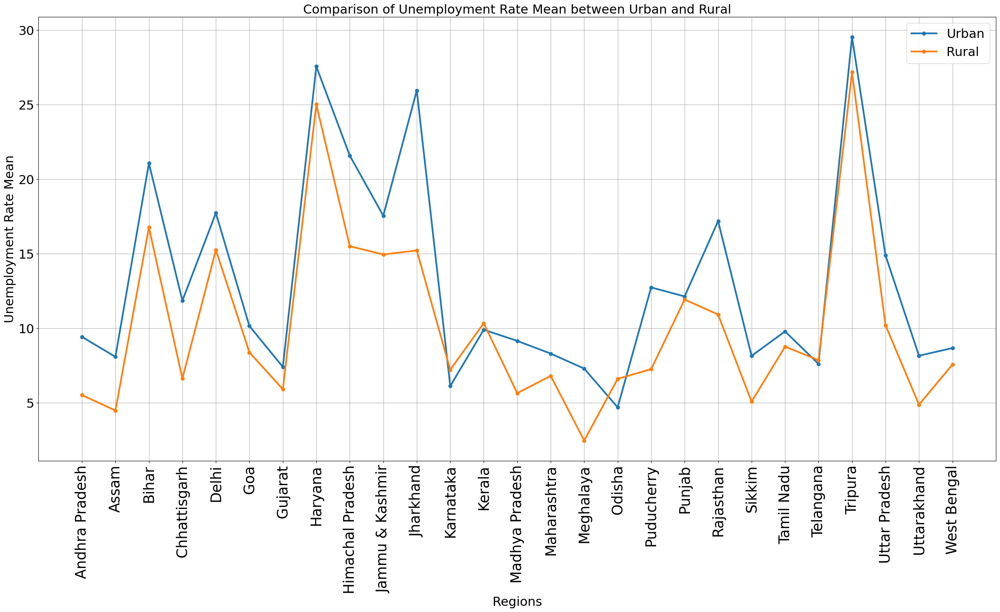

In [32]:
plot_comparison(grouped_urban_stats_com['Unemployment Rate Mean'], grouped_rural_stats['Unemployment Rate Mean'], 'Unemployment Rate Mean', 'Comparison of Unemployment Rate Mean between Urban and Rural')

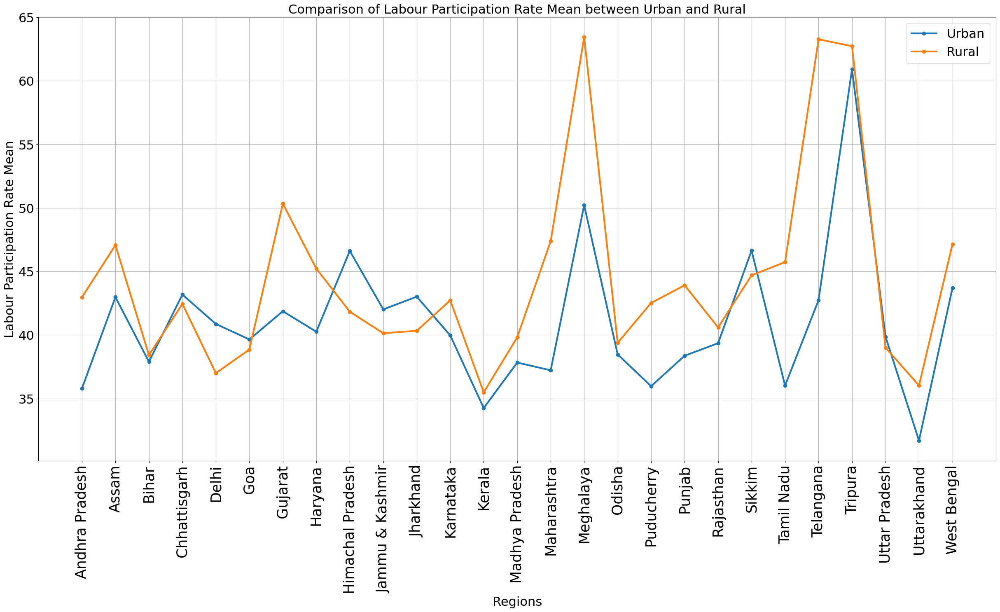

In [33]:
plot_comparison(grouped_urban_stats_com['Labour Participation Rate Mean'], grouped_rural_stats['Labour Participation Rate Mean'], 'Labour Participation Rate Mean', 'Comparison of Labour Participation Rate Mean between Urban and Rural')

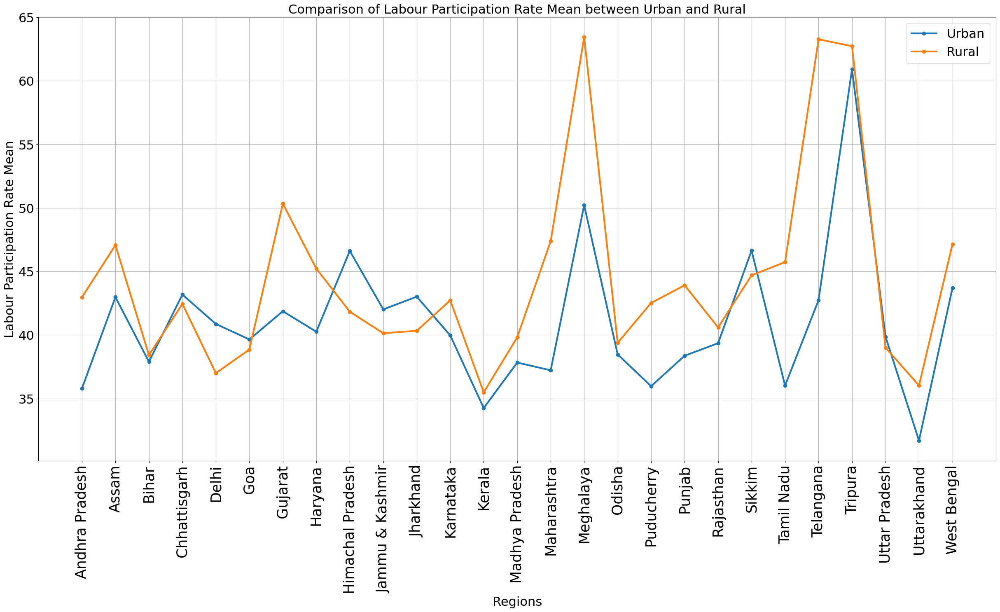

In [35]:
plot_comparison(grouped_urban_stats_com['Labour Participation Rate Mean'], grouped_rural_stats['Labour Participation Rate Mean'], 'Labour Participation Rate Mean', 'Comparison of Labour Participation Rate Mean between Urban and Rural')

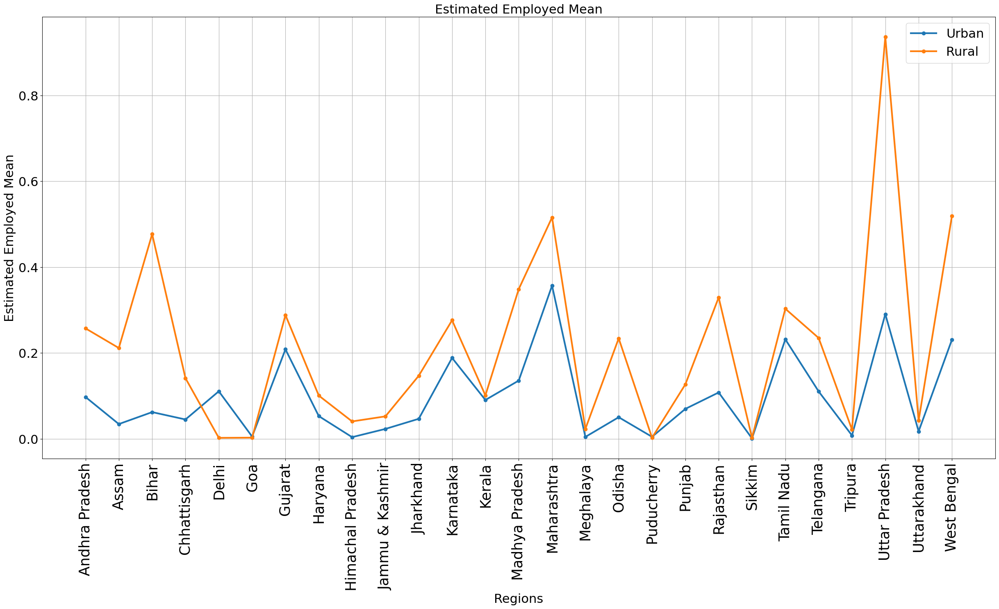

In [36]:
plot_comparison(grouped_urban_stats_com['Estimated Employed Mean'], grouped_rural_stats['Estimated Employed Mean'], 'Estimated Employed Mean', 'Estimated Employed Mean')

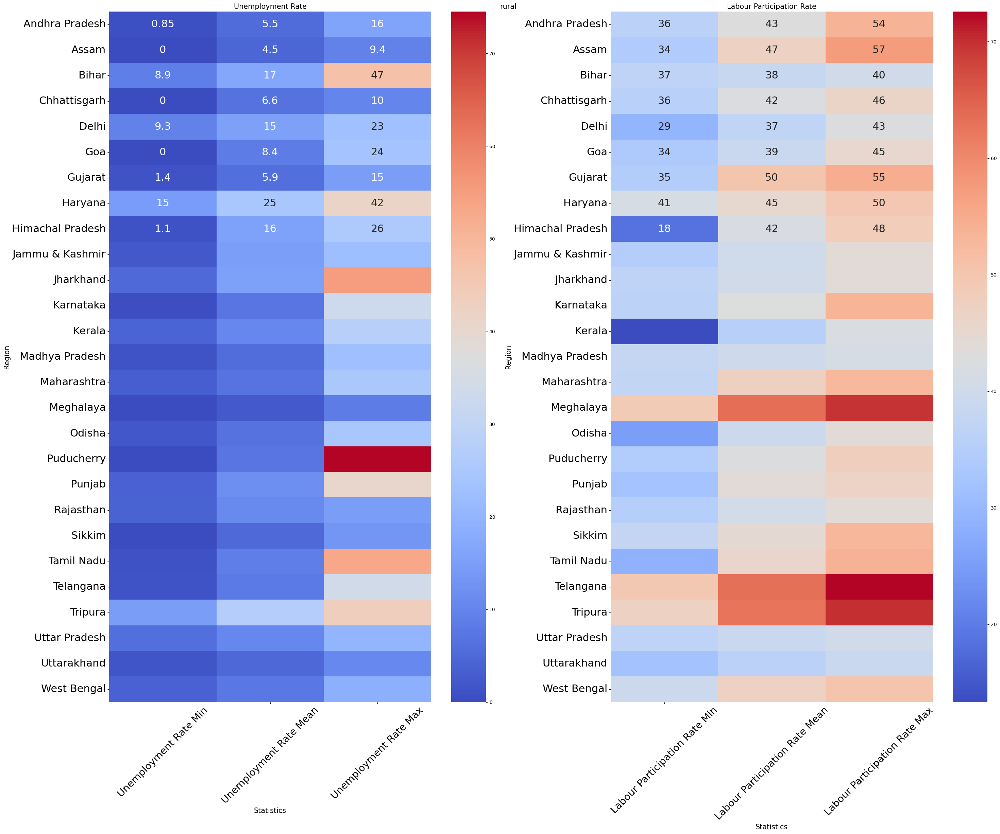

In [37]:
plot_heatmap_(grouped_rural_stats,'rural')

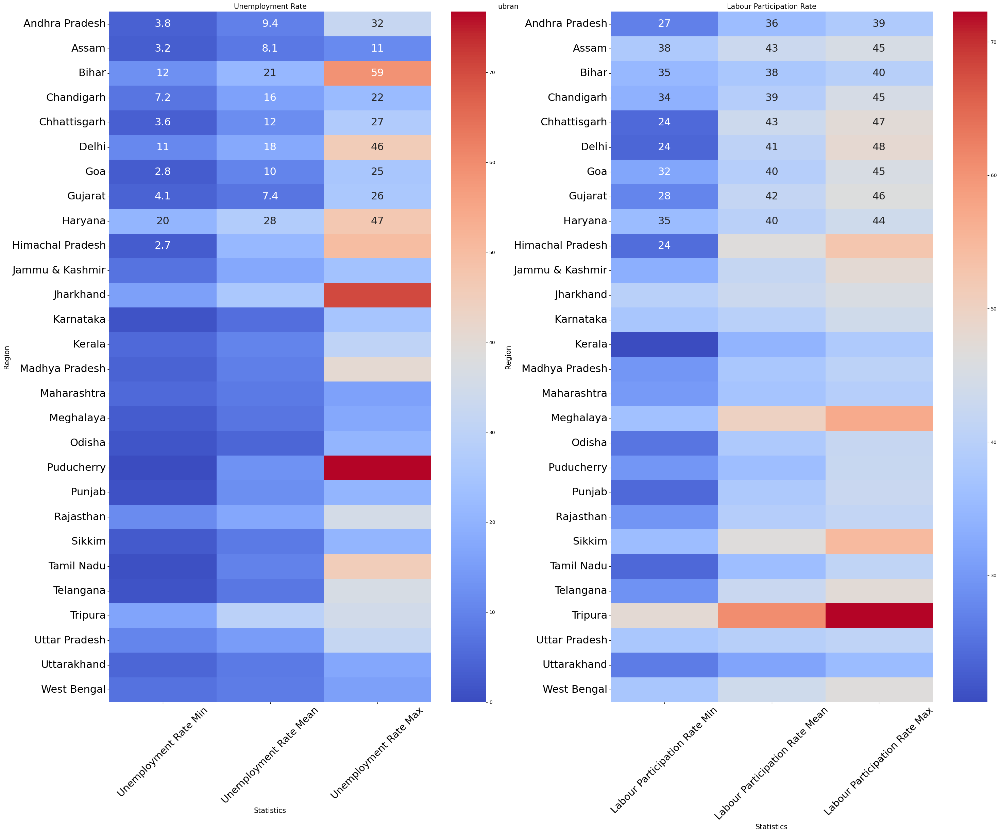

In [38]:
plot_heatmap_(grouped_urban_stats,'ubran')

In [39]:
grouped_rural_stats['Covid19 Unemployment Rate Effect'] = grouped_rural_stats['Unemployment Rate Std'] * grouped_rural_stats['Estimated Employed Mean']
grouped_urban_stats['Covid19 Unemployment Rate Effect'] = grouped_urban_stats['Unemployment Rate Std'] * grouped_urban_stats['Estimated Employed Mean']

grouped_rural_stats['Covid19 Labour Participation Rate Effect'] = grouped_rural_stats['Labour Participation Rate Std'] * grouped_rural_stats['Estimated Employed Mean']
grouped_urban_stats['Covid19 Labour Participation Rate Effect'] = grouped_urban_stats['Labour Participation Rate Std'] * grouped_urban_stats['Estimated Employed Mean']

In [40]:
def plot_heatmap_effect(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(30,25))  # Create a figure with two subplots

    # Plot the first column
    sns.heatmap(data.loc[:, ['Covid19 Unemployment Rate Effect']], ax=axs[0], annot=True,cmap="YlGnBu",annot_kws={"size": 22})
    axs[0].set_title('Unemployment Rate', fontsize=15)

    # Plot the second column
    sns.heatmap(data.loc[:, ['Covid19 Labour Participation Rate Effect']], ax=axs[1], annot=True, cmap="YlGnBu",annot_kws={"size": 22})
    axs[1].set_title('Labour Participation Rate', fontsize=15)

    # Set the overall title for the figure
    plt.suptitle(title, fontsize=15)
    axs[0].set_xlabel('Statistics', fontsize=15)
    axs[0].set_ylabel('Region', fontsize=15)
    axs[1].set_xlabel('Statistics', fontsize=15)
    axs[1].set_ylabel('Region', fontsize=15)
    axs[0].tick_params(axis='x', rotation=45, labelsize=21)
    axs[0].tick_params(axis='y', labelsize=22)
    axs[1].tick_params(axis='x', rotation=45, labelsize=21)
    axs[1].tick_params(axis='y', labelsize=22)
    plt.tight_layout()

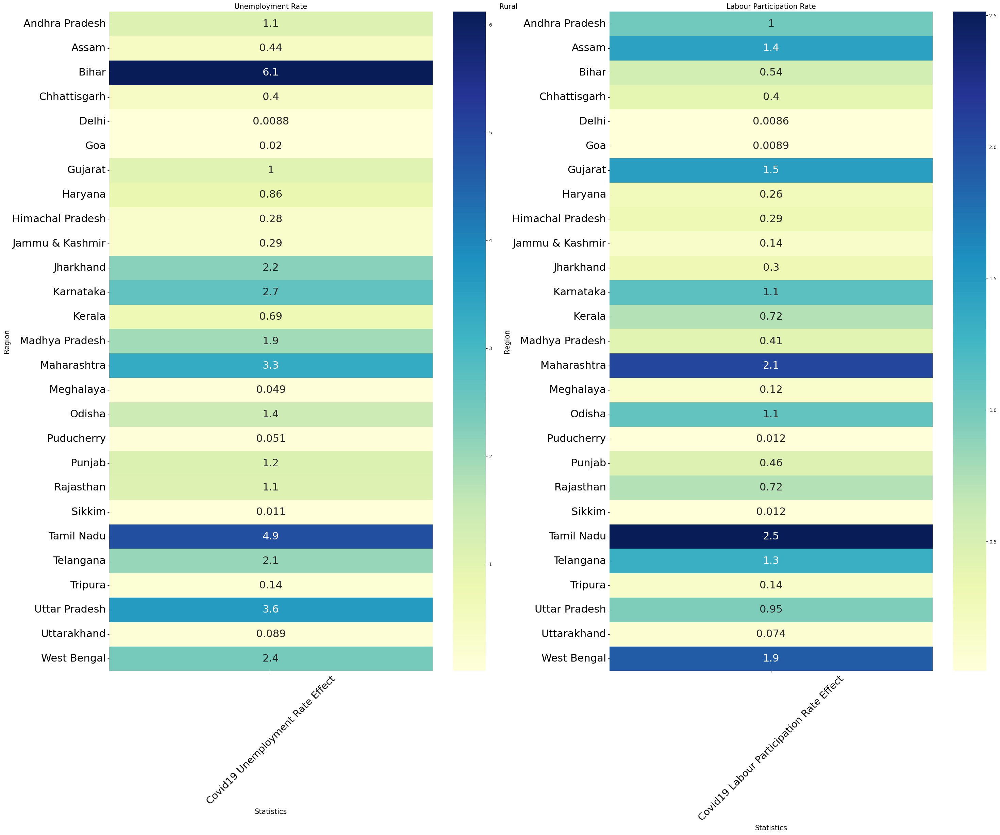

In [41]:
plot_heatmap_effect(grouped_rural_stats, 'Rural')

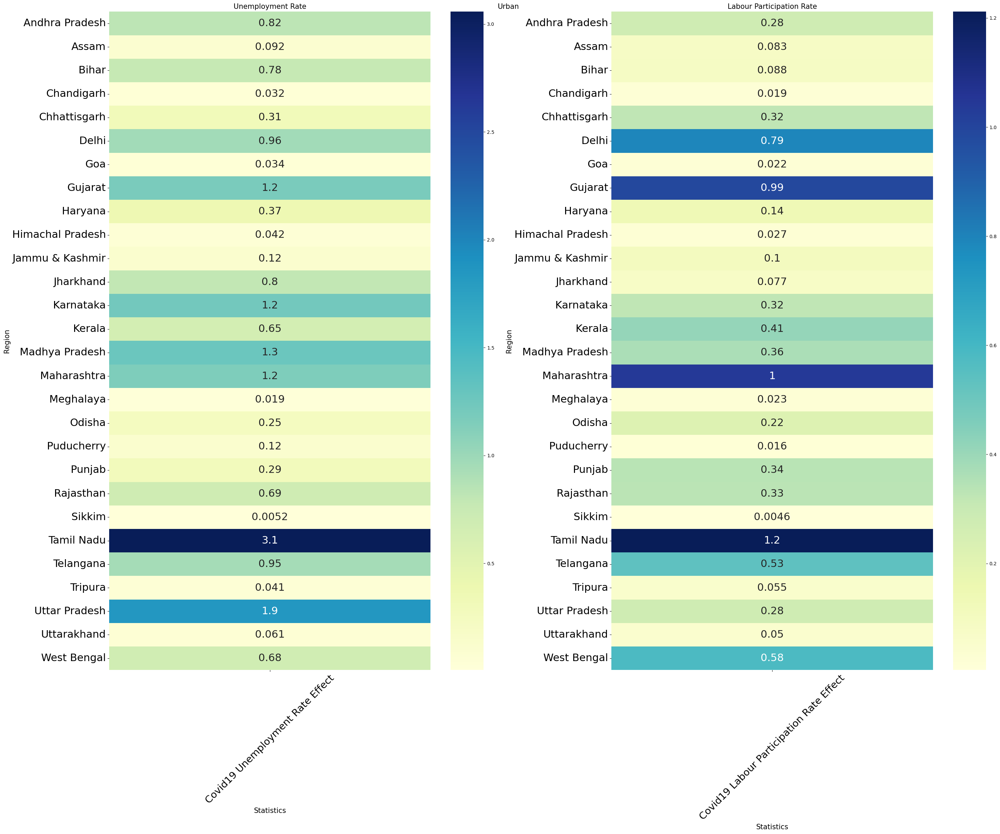

In [42]:
plot_heatmap_effect(grouped_urban_stats, 'Urban')

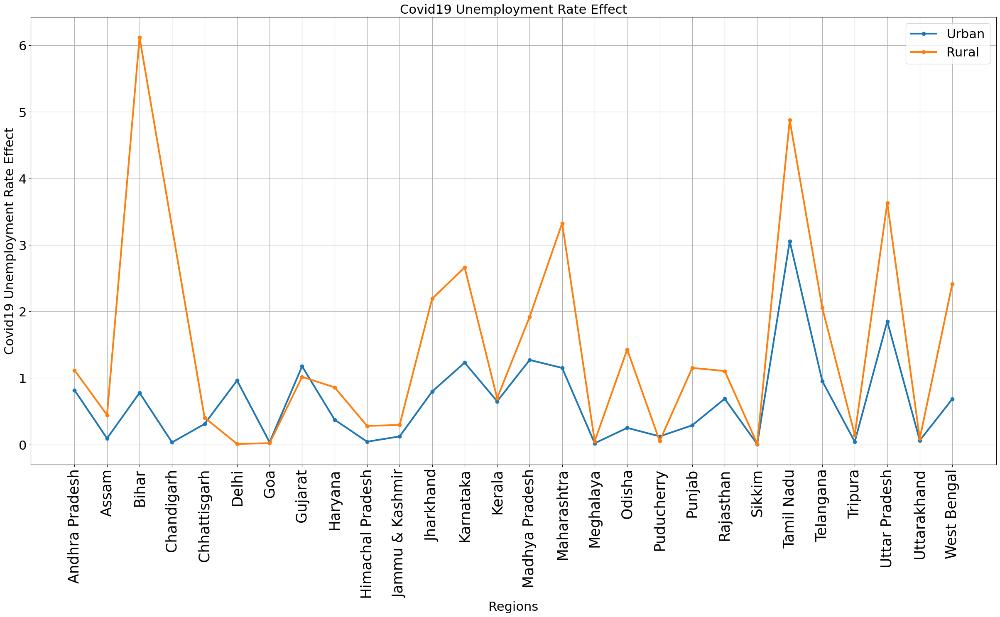

In [43]:
plot_comparison(grouped_urban_stats['Covid19 Unemployment Rate Effect'], grouped_rural_stats['Covid19 Unemployment Rate Effect'], 'Covid19 Unemployment Rate Effect', 'Covid19 Unemployment Rate Effect')

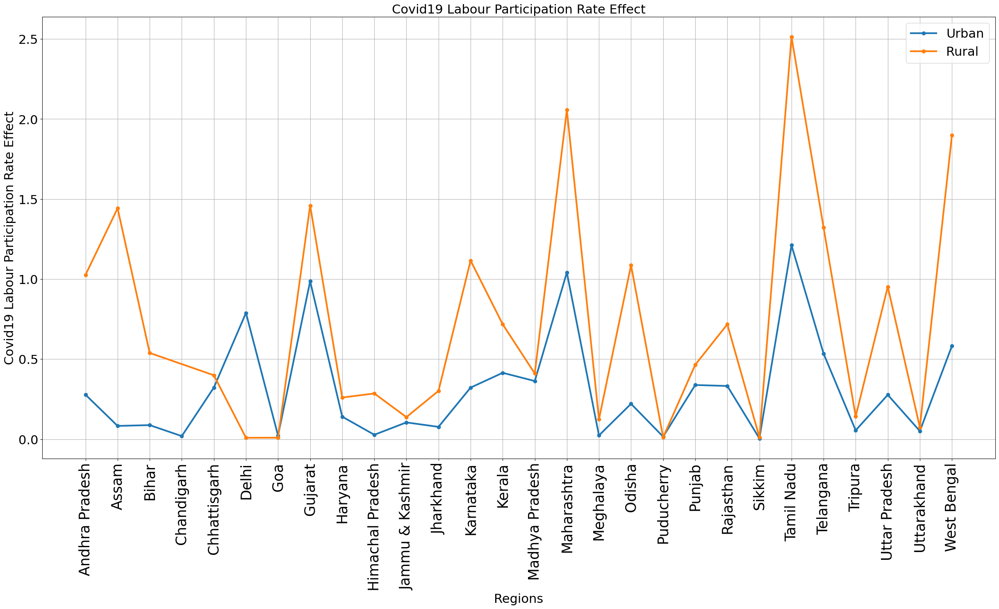

In [44]:
plot_comparison(grouped_urban_stats['Covid19 Labour Participation Rate Effect'], grouped_rural_stats['Covid19 Labour Participation Rate Effect'], 'Covid19 Labour Participation Rate Effect', 'Covid19 Labour Participation Rate Effect')

The Covid19 Effect of Labour Participation Rate in rural Area is higher than it in urban Area for all Stats except Delhi state.
